# Project Explainer Notebook
Made by Bjørn Vinther (s152423) and Peter Scheel (s152424)

# Motivation
### What is our dataset?
This dataset contains filming locations in San Francisco:

* 1265 data objects (each contains an unique film location) (244 kB total)

* 12 attributes

* Title, Release Year, Location, Fun Facts, Production Company, Distributor, Director, Writer, Actor 1, Actor 2, Actor 3, "Smile Again, Jenny Lee"

* The 1265 film locations are distributed over 220 different movies

* Movies date back to 1915 and up to early 2016

This seems like a small dataset, but we went with it which proved to need a lot of processing afterwards.

### Okay, but why this dataset?
We wanted something we found interesting in our spare time. It was either something with movies, or something with games, and this dataset seemed to fit best for what we've done previously in the course. We liked the visualization of location-based data, and working with geoplots. 

This could be useful for film studios to easily find locations that matched a certain genre. It could also be interesting for film entutiasts to see if there are any patterns in the filming locations and the type of movie. (e.g. genre or rating)

After working with the dataset it proved a bit too challenging to get any proper results from. Rather than discaarding all the preliminary work and change data set we chose to supplement the dataset with information from other sources.

# Basic stats
### Cleaning and preproccesing of the data
We spend a lot of time on processing the data. We tried to find other datasets to supplement our dataset but we didn't manage to find any. We started being creative and tried to use major web databases such as google, IMDB, and Facebook to collect any other useful information.  

We started of by then combining the original dataset with information from IMDb. The original data set had a lot of errors and missing values, so we instead used it to find the movie on IMDB and then use the data from IMDB. This was done automatically using a python plugin. Any movies the couldn't find automatically we tried findin manually. If we still weren't able to find it we would discard it. We also discarded all tv-series (total of 8).

The locations were names in the original dataset, so we used the Google geocoder to convert these names into latitude and longitude coordinates. This was very demanding task since Google has limits on the API calls, so it had to be processed over a couple of days. Additionally, not all coordinates were correct so we still had to detect and remove outliers. 

Finally, we used Facebook to get information about places nearby some of the positions in the dataset. The data took very long to receive, and as Google, Facebook has a limit on their API, so the data sadly didn't make it into any of our visualizations. The hope was that this information could help us tell more about the area around a geo-coordinate. 

### Attributes
Of the 12 attributes, we didn't really use much of the data for our models:
* Title 
 * Title of the movie, not so relevant for our problem
* Release Year
 * Year of release, used to categorize our locations into decades
* Location 
 * The most important attribute in our data
* Fun Facts
 * Random facts, not so relevant for our problem
* Production Company
 * Distributor of the movie, not really used, but could have been interesting
* Distributor
 * Distributor of the movie, not really used, but could have been interesting
* Director
 * Director of the movie, not so relevant for our problem
* Writer
 * Write of the movie, not so relevant for our problem
* Actor 1, Actor 2, Actor 3
 * Top 3 actors in the movie, not so relevant for our problem
* "Smile Again, Jenny Lee"
 * One movie has an entry in this attribute, funnily enought, the movie called "Smile Again, Jenny Lee"

### Initial visualizations and basic plots
<img src="https://raw.githubusercontent.com/Selech/Selech.github.io/master/Python/img/GenreScore.png" alt="Drawing" style="width: 400px;"/>
<img src="https://raw.githubusercontent.com/Selech/Selech.github.io/master/Python/img/DistributionOfRatings.png" alt="Drawing" style="width: 400px;"/>
<img src="https://raw.githubusercontent.com/Selech/Selech.github.io/master/Python/img/LocationsPrMovie.png" alt="Drawing" style="width: 400px;"/>
<img src="https://raw.githubusercontent.com/Selech/Selech.github.io/master/Python/img/MoviesPrDirector.png" alt="Drawing" style="width: 400px;"/>
<img src="https://raw.githubusercontent.com/Selech/Selech.github.io/master/Python/img/MoviesPrGenre.png" alt="Drawing" style="width: 400px;"/>
<img src="https://raw.githubusercontent.com/Selech/Selech.github.io/master/Python/img/MoviesPrStudio.png" alt="Drawing" style="width: 400px;"/>
<img src="https://raw.githubusercontent.com/Selech/Selech.github.io/master/Python/img/Heatmap-locations.png" alt="Drawing" style="width: 400px;"/>
<img src="https://raw.githubusercontent.com/Selech/Selech.github.io/master/Python/img/Heatmap-facebook.png" alt="Drawing" style="width: 400px;"/>

# Theory
### Our models

#### Decision Forrest
We chose to use a decision forest to classify the genre based on the year and geo-coordinate of a filming location. We chose a decision forest because we believed it was unlikely that there was a linear relation between the geo-coordinates and the genre. A decision forest would be able make a better model.

Our first challenge was that each movie could have multiple genres. To solve this, we chose to train a decision forest for each genre. The data only contained two classes, either having the given genre or not, and we used to decision forest to learn the probability of a data point having a given genre. 

Another challenge we faced was that the data was unbalanced since some genres were more popular than others (e.g. the genre "war" only had one movie). We solved this be combining all the unpopular genres into a genre called "Other". We also resampled the training data so there was an equal amount entries for both of the two classes. 

We trained the data on 80 % of the data and used 20 % for testing. We used "entropy" to determine the optimal splits in the decision trees and calculated the performance by determining the fraction of correct predictions. 


#### KNN
The idea was to see if there were some tendencies only based on the location. It would be cool to see specific parts of the city being used for specific genres. Our initial model came up with this map of San Francisco for the genres:
<img src="https://raw.githubusercontent.com/Selech/Selech.github.io/master/Python/img/KNN.png" alt="Drawing" style="width: 400px;"/>
We did the same thing for the specific ratings for each location. Our initial model came up with this map of San Francisco for the ratings:
<img src="https://raw.githubusercontent.com/Selech/Selech.github.io/master/Python/img/KNN-2.png" alt="Drawing" style="width: 400px;"/>

We used K-fold to determine the optimal amount of neighbors for our KNN:
<img src="https://raw.githubusercontent.com/Selech/Selech.github.io/master/Python/img/KNN-cross.png" alt="Drawing" style="width: 400px;"/>
This surely didn't work so well, but we followed the result, and went with K=4 for both models.

We trained the data on 80 % of the data and used 20 % for testing. Calculated the performance by determining how accurate the models could to predict the genre and rating.

#### KMeans
For this model, we would like to see whether there were some clusterings of the locations around the city. Our initial model came up with the following clusters, using 10 clusters as a starting point:
<img src="https://raw.githubusercontent.com/Selech/Selech.github.io/master/Python/img/KMeans.png" alt="Drawing" style="width: 400px;"/>
This model is able to find any clusters in the data, making it possible to see if the data have any sort of grouping.

For this model we didn't use any cross validation, as we knew that we wanted to make the amount clusters interactable for the end-user.

This model did cluster the data, and for specific areas, it seems to work decently. The dataset clearly has most of the locations in the central part of the city, and therefore there are most clusters at that part of the map.

# Visualizations
### Explain the visualizations you've chosen.
All of our visualizations on our models, we chose to go with Geoplots. Each of the models are using locations. 

#### Decision Forrest
Our Decision Forest, we chose to use a geoplot and then predict a probability that a certain genre would be at that position in a specific decade. This was done for each point in the grid.

#### KNN
Our KNN also use a geoplot and then predict that a certain genre would be at that position but is not using the decade as the Decision Forrest. This was done for each point in the grid.
The same was done for a KNN model trained to predict the IMDb rating instead of the genre.

#### KMeans
The KMeans clustering is using the same visualization as presented in the second assignment. We included the possibility to change the amount of clusters from 2-10, and for fun, we also did clustering of the individual genres.

### Why are they right for the story you want to tell?
Our visualization are supporting the main goal, eventhough it doesn't determine anything concrete. We are using the forest to predict the probability of a certain genre.

# Discussion
### The good stuff
We used a lot of alternative ways of getting data which potentially could have let to new discoveries. We did see some tendencies in our models, although the many locations in the downtown district makes it hard to differentiate the genres in there, each of the models actually shows that certain genres seem to be located in certain parts of the city.

### The bad stuff
Our dataset was lacking useful data. Most of our data did not seem to be correlated in any way and even though we hoped to find new cool patterns we just ended up finding nothing, but we guess that one of the risks when exploring data. Had we had more data we would probably had had a greater chance of finding some patterns. We would have liked to look more into the the surroundings of the clusters we've found. The processing of our small data clearly took up way too much of our time, and we didn't get to plot enough super cool plots or learn amazing models. 

# Code stuff

## IMDB

In [4]:
import json

def read_json(file_name):
    with open(file_name) as data_file:    
        return json.load(data_file)
    
json_obj = read_json("Data/transformed_data1.json")

In [5]:
import imdb

# Create the object that will be used to access the IMDb's database.
imdb_obj = imdb.IMDb() # by default access the web.

def find_movie_id(title, year):
    # search movie title
    for movie_id in imdb_obj.search_movie(title)[:10]:
        imdb_obj.update(movie_id)
        if year == movie_id["year"]:
            return movie_id
    print "Could not find: ", title, " - ", year   

def find_movies():
    print "start loading..."
    result = {}
    i = 0
    
    for movie in json_obj.itervalues():
        i += 1
        if i % 10 == 0:
            print "Loaded", i, "movies"

        title = movie["Title"]
        m_id = find_movie_id(title, float(movie["Year"]))
        result[title] = m_id
        
    return result

movie_ids = find_movies()

start loading...
Loaded 10 movies
Loaded 20 movies
Loaded 30 movies
Loaded 40 movies
Loaded 50 movies
Loaded 60 movies
Loaded 70 movies
Loaded 80 movies
Loaded 90 movies
Loaded 100 movies
Loaded 110 movies
Loaded 120 movies
Loaded 130 movies
Loaded 140 movies
Loaded 150 movies
Loaded 160 movies
Loaded 170 movies
Loaded 180 movies
Loaded 190 movies
Loaded 200 movies
Loaded 210 movies


In [7]:
# retrieves the information from a movie
def get_info(m_id):
    imdb_obj.update(m_id)
    title = str(m_id["title"])
    year = m_id["year"]
    
    kind = str(m_id["kind"])
    if kind == 'tv movie':
        kind = 'movie'
    elif kind == 'episode':
        kind = 'tv series'
    
    
    rating = ''
    if 'rating' in m_id.keys():
        rating = m_id['rating']
        
    genres = ""
    if 'genres' in m_id.keys():
        genres = [str(x) for x in m_id['genres']]
        
    directors = ""
    if 'director' in m_id.keys():
        directors = [str(x) for x in m_id['director']]
        
    studio = ""
    if 'production companies' in m_id.keys():
        studio = [str(x) for x in m_id['production companies']]
        
    return {'title': title, 'year': year, 'rating': rating, 'genres': genres, 'director': directors, 'studio': studio, 'type': kind}
    
def filter_data():
    result = []
    for movie in json_obj.itervalues():
        m_id = movie_ids[movie['Title']]
        data = get_info(m_id)
        if data['type'] != 'movie':
            continue
        else:
            del data['type']
            data['locations'] = movie['Locations']
            result.append(data)
            
    return result
    
filtered_data = filter_data()

In [8]:
rating = []
directors = []
studios = []
genres = []

for x in filtered_data:
    if x['rating'] == "":
        rating.append(x['title'])
    if x['director'] == "":
        directors.append(x['title'])
    if x['genres'] == "":
        genres.append(x['title'])
    if x['studio'] == "":
        studios.append(x['title'])

print "Movies missing:"
print "directors: ", len(directors), directors
print "rating: ", len(rating), rating
print "genres: ", len(genres), genres
print "studios: ", len(studios), studios

Movies missing:
directors:  0 []
rating:  6 ['GOD IS A COMMUNIST!?* (show me heart universe)', 'Cardinal X', 'Smile Again, Jenny Lee', "I's", 'Americana', 'Love & Taxes']
genres:  1 ['Mission']
studios:  4 ['GOD IS A COMMUNIST!?* (show me heart universe)', "I's", 'Swing', 'Mission']


In [9]:
import json

def write_json(json_obj, file_name):
    with open(file_name, 'w') as outfile:
        json.dump(json_obj, outfile)

data_obj = {"data": filtered_data}
write_json(data_obj, "transformed_data2.json")

In [10]:
import json

def read_json(file_name):
    with open(file_name) as data_file:    
        return json.load(data_file)
    
def write_json(json_obj, file_name):
    with open(file_name, 'w') as outfile:
        json.dump(json_obj, outfile)
    
movie_list = read_json("transformed_data2.json")['data']

other_genres = ['Family', 'Biography', 'Fantasy', 'Film-Noir', 'Horror', 'History', 'Music', 'Musical', 'Documentary', 
                    'Sport', 'War', 'Short']

for movie in movie_list:
    has_other = False
    new_genre_list = []
    for genre in movie['genres']:
        if genre in other_genres:
            has_other = True
        else:
            new_genre_list.append(genre)
            
    if has_other:
        new_genre_list.append('Other')
            
    movie['genres'] = new_genre_list
    
data_obj = {"data": movie_list}
write_json(data_obj, "transformed_data3.json")

## Google

In [13]:
import csv

def is_valid_row(row):
    return row[0] != "Title" and row[0] != "" and row[1] != "" and row[2] != ""

def csv_as_json():
    with open('Data/Film_Locations.csv', 'rb') as csvfile:
        fileReader = csv.reader(csvfile)
        result = {}
        i = 0;
        
        for row in fileReader:
            if is_valid_row(row):
                # if movie exists only add location
                if row[0] in result:
                    result[row[0]]["Locations"].append(row[2])
                else:
                    # if movie does not exist we create it
                    movie = {"Title": row[0], "Year": row[1], "Studio": row[5], 
                             "Locations": [row[2]], "Director": row[6], 
                             "Actors": [row[8], row[9], row[10]]}
                    result[row[0]] = movie
        
        return result
    
data_obj = csv_as_json()

In [14]:
len(data_obj)

220

In [15]:
import json

def write_json(json_obj, file_name):
    with open(file_name, 'w') as outfile:
        json.dump(json_obj, outfile)
        
write_json(data_obj, "output.json")

In [16]:
from geopy import geocoders

def read_json(file_name):
    with open(file_name) as data_file:    
        return json.load(data_file)
        
geolocator = geocoders.GoogleV3()

def locate(name):
    try:
        query = name + ", San Francisco";
        location = geolocator.geocode(query, timeout=10)
        return location.latitude, location.longitude
    except AttributeError:
        print "Couldn't read ", name
        return 0, 0

In [17]:
import json

def read_json(file_name):
    with open(file_name) as data_file:    
        return json.load(data_file)

json_obj = read_json("output.json")

def transform_locations(stop_at, obj):
    i = 0
    for key, movie_obj in obj.iteritems():
        i += 1
        if i == stop_at:
            break

        print i, key
        locations = []
        for loc in movie_obj["Locations"]:
            # check if it is not onverted already
            if isinstance(loc, basestring):
                lat, lon = locate(loc)
                locations.append({"Lat": lat, "Lon": lon})
                print "not done"
            else:
                locations.append(loc)

        movie_obj["Locations"] = locations

In [ ]:
def count_invalid_values(json_obj):
    faulty_locs = 0
    faulty_actors = 0
    
    for key, val in json_obj.iteritems():
        for loc in val["Locations"]:
            if loc["Lat"] == 0 or loc["Lon"] == 0:
                faulty_locs += 1
                print key
                
        for actor in val["Actors"]:
            if actor == "":
                faulty_actors += 1
                
    return faulty_locs, faulty_actors

def remove_invalid_values(json_obj):
    for key, val in json_obj.iteritems():
        for loc in val["Locations"]:
            if loc["Lat"] == 0 or loc["Lon"] == 0:
                val["Locations"].remove(loc)
                
        for actor in val["Actors"]:
            if actor == "":
                val["Actors"].remove(actor)
    
    

print count_invalid_values(json_obj)

In [19]:
def write_json(json_obj, file_name):
    with open(file_name, 'w') as outfile:
        json.dump(json_obj, outfile)

write_json(json_obj, "transformed_data.json")

## Facebook

### Install the facebook graph api

<pre>pip install -e git+https://github.com/mobolic/facebook-sdk.git#egg=facebook-sdk</pre>

Token skal opdateres kan gøres her: https://developers.facebook.com/tools/explorer

In [20]:
import facebook

token = "EAACEdEose0cBAGSelcsPEtCEwf7pavlq9xUMZCq8qduzT3koZAsWoA9SiAtbQHVBiIZA5Bt1BdnYZCwGOF4Sh2UpylZAECDXipHbUHk1uWMZC70l1OoCwG32euvatSosZB3nXgQbZCVYNAZBu4xjstCLCQb3DjOZB2TxoAPlEmFEQZCNwZDZD"
graph = facebook.GraphAPI(access_token=token, version='2.6')

In [21]:
request = "search?type=place&q=*&center=37.761474,-122.439021&distance=10000&fields=name,location,checkins"
result = graph.request(request)

In [22]:
places = []

for place in result["data"]:
    if "checkins" in place:
        obj = dict()
        obj["name"] = place["name"]
        obj["visitors"] = int(place["checkins"])
        obj["lat"] = place["location"]["latitude"]
        obj["lon"] = place["location"]["longitude"]
        
        places.append(obj)

# list of locations in SF sorted by visitors
sorted_places = sorted(places, key=lambda k: k['visitors'], reverse=True)[1:]
print "Number of places", len(places)
print "Total visitors: ", sum([x["visitors"] for x in sorted_places])
print "10 most visited places: ", [str(x["name"]) for x in sorted_places[:10]]

print sorted_places[0]["visitors"]

Number of places 330
Total visitors:  12216238
10 most visited places:  ['AT&T Park', 'Golden Gate Bridge', 'Union Square, San Francisco', 'PIER 39', 'California Academy of Sciences', 'Ghirardelli Square', 'Alcatraz Island', 'Dolores Park', 'San Francisco Ferry Building', 'Palace of Fine Arts']
2903818


In [23]:
def isValid(x,y):
    if x > -122.5 and x < -122.0 and y < 38.0 and y > 37.5:
        return True
    else:
        return False

pros_x = []
pros_y = []

for p in places:
    x = p["lon"]
    y = p["lat"]
    for visit in range(p['visitors']):
        if isValid(x,y):
            pros_y.append(y)
            pros_x.append(x)

In [24]:
import geoplotlib
from geoplotlib.utils import read_csv, BoundingBox

def findBoundingbox(x,y):
    west = min(x[:])-0.03
    east = max(x[:])+0.03
    north = min(y[:])-0.03
    south = max(y[:])+0.03
    
    boundingbox = BoundingBox(north=north, west=west, south=south, east=east)
    
    return boundingbox

geo_data_for_plotting = {"lat": [float(d) for d in pros_y], "lon": [float(d) for d in pros_x]}

geoplotlib.kde(geo_data_for_plotting, bw=2)
geoplotlib.set_bbox(findBoundingbox(pros_x,pros_y))
geoplotlib.inline()

('smallest non-zero count', 1.2000476691252412e-06)
('max count:', 299404.42513619416)


## KNN

In [1]:
import json

def read_json(file_name):
    with open(file_name) as data_file:    
        return json.load(data_file)
    
json_obj = read_json("Data/transformed_data3.json")

In [2]:
def isValid(x,y):
    if x > -122.5 and x < -122.0 and y < 38.0 and y > 37.5:
        return True
    else:
        return False

def readDataRating(x,y):
    for movie in json_obj["data"]:
        if movie["genres"] != []:
            if movie["rating"] != "":
                rating = movie["rating"]
                for loc in movie["locations"]:
                    lon = loc["Lon"]
                    lat = loc["Lat"]
                    genre = movie["genres"][0]
                    if isValid(lon,lat):
                        x.append([lon,lat])
                        y.append(int(rating))
                        
    
    
def readData(x,y):
    for movie in json_obj["data"]:
        if movie["genres"] != []:
            for loc in movie["locations"]:
                lon = loc["Lon"]
                lat = loc["Lat"]
                genre = movie["genres"][0]
                if isValid(lon,lat):
                    x.append([lon,lat])
                    if genre in unique_genres:
                        y.append(unique_genres.index(genre))
                    else:
                        unique_genres.append(genre)
                        y.append(unique_genres.index(genre))

In [3]:
from csv import reader 
import numpy as np
import pylab as pl
from sklearn import neighbors, datasets

x = []
y = []
unique_genres = []

readDataRating(x, y)

In [4]:
ndarrayX = np.array(x)
ndarrayY = np.array(y)

knn = neighbors.KNeighborsClassifier()
knn.fit(ndarrayX, ndarrayY)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
           metric_params=None, n_jobs=1, n_neighbors=5, p=2,
           weights='uniform')

In [6]:
h = .0001

# Plot the decision boundary. For that, we will asign a color to each
# point in the mesh [x_min, m_max]x[y_min, y_max].
x_min, x_max = ndarrayX[:,0].min() - .01, ndarrayX[:,0].max() + .01
y_min, y_max = ndarrayX[:,1].min() - .01, ndarrayX[:,1].max() + .01
xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
Z = knn.predict(np.c_[xx.ravel(), yy.ravel()])

Populating the interactive namespace from numpy and matplotlib


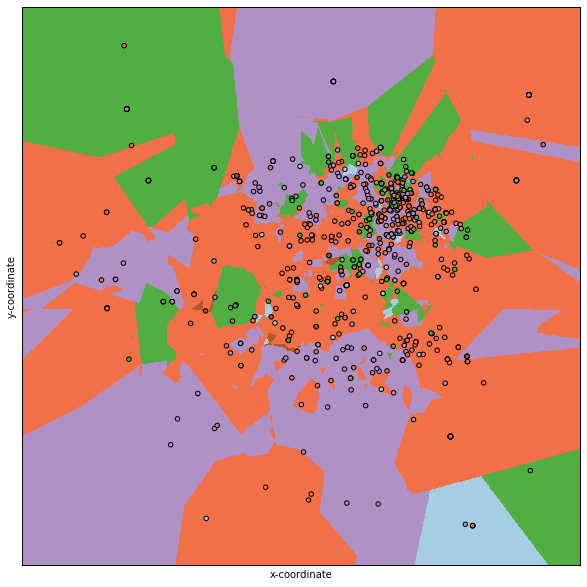

In [7]:
%pylab inline

# Put the result into a color plot
Z = Z.reshape(xx.shape)
pl.figure(1, figsize=(10, 10))
pl.set_cmap(pl.cm.Paired)
pl.pcolormesh(xx, yy, Z)

# Plot also the training points
pl.scatter(ndarrayX[:,0], ndarrayX[:,1],c=ndarrayY )
pl.xlabel('x-coordinate')
pl.ylabel('y-coordinate')

pl.xlim(xx.min(), xx.max())
pl.ylim(yy.min(), yy.max())
pl.xticks(())
pl.yticks(())
pl.show()

In [8]:
import numpy as np
from scipy.io import loadmat


# Loading data
data_x = x
tmpY = []
for c in y:
    tmpY.append([c])
data_y = np.uint8(tmpY)
attributes = []
classifications = range(1,10)

X = np.matrix(data_x)
Y = np.matrix(data_y)
C = len(classifications)
M = len(attributes)
N = len(data_x)

attributeNames = [i[0] for i in attributes]
classNames = classifications# [j[0] for i in mat_data['classNames'] for j in i]

# Update N and M
N, M = X.shape

print 'Refreshed'

Refreshed


Populating the interactive namespace from numpy and matplotlib


`%matplotlib` prevents importing * from pylab and numpy


Done


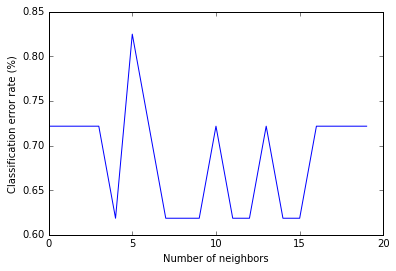

In [18]:
%pylab inline
from pylab import *
from scipy.io import loadmat
from sklearn.neighbors import KNeighborsClassifier
from sklearn import cross_validation

# Maximum number of neighbors
L=20

tc = np.arange(1, 2, 1)

CV = cross_validation.LeaveOneOut(N)
errors = np.zeros((N,L))

# K-fold crossvalidation
K = 10
CV = cross_validation.KFold(N,K,shuffle=True)

# Initialize variable
Error_train = np.empty((len(tc),K))
Error_test = np.empty((len(tc),K))

i=0
for train_index, test_index in CV:
    #print('Crossvalidation fold: {0}/{1}'.format(i+1,N))    
    
    # extract training and test set for current CV fold
    X_train = X[train_index,:]
    y_train = Y[train_index,:]
    X_test = X[test_index,:]
    y_test = Y[test_index,:]

    # Fit classifier and classify the test points (consider 1 to 40 neighbors)
    for l in range(1,L+1):
        knclassifier = KNeighborsClassifier(n_neighbors=l);
        knclassifier.fit(X_train, ravel(y_train));
        y_est = knclassifier.predict(X_test);
        errors[i,l-1] = np.sum(y_est[0]!=y_test[0,0])

    i+=1

print 'Done'
# Plot the classification error rate
figure()
plot(100*sum(errors,0)/N)
xlabel('Number of neighbors')
ylabel('Classification error rate (%)')
show()

Fitting model for K=1

Fitting model for K=2

Fitting model for K=3

Fitting model for K=4

Fitting model for K=5

Fitting model for K=6

Fitting model for K=7

Fitting model for K=8

Fitting model for K=9

Fitting model for K=10



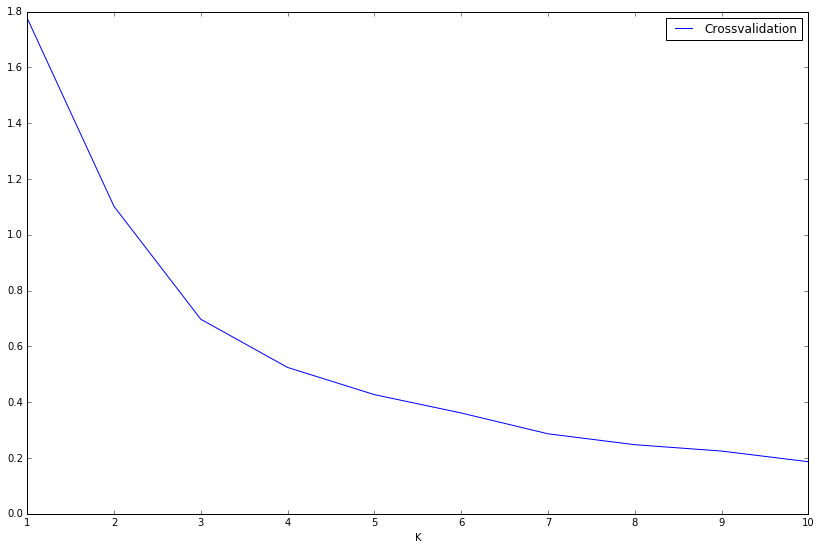

In [19]:
%matplotlib inline
# exercise 10.1.5
from matplotlib.pyplot import *
from pylab import *
from scipy.io import loadmat
from sklearn.mixture import GMM
from sklearn import cross_validation

from sklearn.cluster import KMeans
from sklearn.datasets import make_blobs

# Range of K's to try
KRange = range(1,11)
T = len(KRange)

covar_type = 'full'     # you can try out 'diag' as well
reps = 3                # number of fits with different initalizations, best result will be kept

# Allocate variables
BIC = np.zeros((T,1))
AIC = np.zeros((T,1))
CVE = np.zeros((T,1))

# K-fold crossvalidation
CV = cross_validation.KFold(N,10,shuffle=True)

for t,K in enumerate(KRange):
        print('Fitting model for K={0}\n'.format(K))

        # Fit Gaussian mixture model
        kmeans = KMeans(n_clusters=K)
        y_pred = kmeans.fit_predict(X)

        # For each crossvalidation fold
        for train_index, test_index in CV:
            # extract training and test set for current CV fold
            X_train = X[train_index]
            X_test = X[test_index]

            # Fit Gaussian mixture model to X_train
            kmeans = KMeans(n_clusters=K)
            y_pred = kmeans.fit_predict(X_train)

            # compute negative log likelihood of X_test
            CVE[t] += -kmeans.score(X_test).sum()
            

# Plot results

figure(figsize=(14,9))
hold(True)
plot(KRange, 2*CVE)
legend(['Crossvalidation'])
xlabel('K')
show()

Same goes for the genre! 
## Grid for KNN

In [20]:
import geoplotlib
from geoplotlib.utils import read_csv, BoundingBox
from csv import reader 



gridSize = 100
boundingbox = BoundingBox(north=37.8299754923, west=-122.509928313, south=37.6981535998, east=-122.354937494)

y_steps = abs((boundingbox.north - boundingbox.south)) / gridSize
x_steps = abs((boundingbox.west - boundingbox.east)) / gridSize

x_list = []
y_list = []

for x in range(gridSize):
    for y in range(gridSize):
        x_list.append(boundingbox.west + (x * x_steps))
        y_list.append(boundingbox.north - (y * y_steps))

geo_data_for_plotting = {"lat": [float(d) for d in y_list], "lon": [float(d) for d in x_list]}
geoplotlib.dot(geo_data_for_plotting, color='red')
geoplotlib.set_bbox(boundingbox)
geoplotlib.inline()

In [25]:
# These are the "Tableau 20" colors as RGB.    
tableau20 = [[31, 119, 180], [174, 199, 232], [255, 127, 14], [255, 187, 120],    
             [44, 160, 44], [152, 223, 138], [214, 39, 40], [255, 152, 150],    
             [148, 103, 189], [197, 176, 213]] 
  
# Scale the RGB values to the [0, 1] range, which is the format matplotlib accepts.    
for i in range(len(tableau20)):    
    r, g, b = tableau20[i]    
    tableau20[i] = [r, g, b]  
    
print len(tableau20)

10


In [26]:
import geoplotlib
from geoplotlib.utils import read_csv, BoundingBox
from csv import reader 
import numpy as np
from sklearn import neighbors, datasets
from sklearn.neighbors import KNeighborsClassifier

genres = {}

for g in range(1,11):
    genres[str(g)+"-"+str(g+1)+"_x"] = []
    genres[str(g)+"-"+str(g+1)+"_y"] = []

knn5 = neighbors.KNeighborsClassifier(5)
knn5.fit(ndarrayX,ndarrayY)

for x in range(100):
    for y in range(100):
        x_value = boundingbox.west + (x * x_steps)
        y_value = boundingbox.north - (y * y_steps)
        
        search = [[x_value, y_value]]
        
        color = knn.predict(search)
        
        genres[str(color[0])+"-"+str(color[0]+1)+"_x"].append(x_value)
        genres[str(color[0])+"-"+str(color[0]+1)+"_y"].append(y_value)

i = 0
for g in range(1,11):
    geo_data_for_plotting = {"lat": [float(d) for d in genres[str(g)+"-"+str(g+1)+"_y"]], "lon": [float(d) for d in genres[str(g)+"-"+str(g+1)+"_x"]]}
    geoplotlib.dot(geo_data_for_plotting, point_size=3, color=tableau20[i])
    i += 1

geoplotlib.set_bbox(boundingbox)
geoplotlib.inline()

In [27]:
import geoplotlib
from geoplotlib.utils import read_csv, BoundingBox
from csv import reader 
import numpy as np
from sklearn import neighbors, datasets
from sklearn.neighbors import KNeighborsClassifier

genres = {}
genreToShow = 8
json = {}

for g in range(1,11):
    genres[str(g)+"-"+str(g+1)+"_x"] = []
    genres[str(g)+"-"+str(g+1)+"_y"] = []

knn5 = neighbors.KNeighborsClassifier(5)
knn5.fit(ndarrayX,ndarrayY)

for x in range(100):
    for y in range(100):
        x_value = boundingbox.west + (x * x_steps)
        y_value = boundingbox.north - (y * y_steps)
        
        search = [[x_value, y_value]]
        
        color = knn.predict(search)
        
        genres[str(color[0])+"-"+str(color[0]+1)+"_x"].append(x_value)
        genres[str(color[0])+"-"+str(color[0]+1)+"_y"].append(y_value)

i = 0
for g in range(1,11):
    geo_data_for_plotting = {"lat": [float(d) for d in genres[str(g)+"-"+str(g+1)+"_y"]], "lon": [float(d) for d in genres[str(g)+"-"+str(g+1)+"_x"]]}
    json[g] = geo_data_for_plotting
    if genreToShow == g:
        geoplotlib.dot(geo_data_for_plotting, point_size=3, color=[255,0,0])
    else:
        geoplotlib.dot(geo_data_for_plotting, point_size=3, color=tableau20[1])
    

geoplotlib.set_bbox(boundingbox)
geoplotlib.inline()

## Unsupervised

In [29]:
import json

def read_json(file_name):
    with open(file_name) as data_file:    
        return json.load(data_file)
    
json_obj = read_json("Data/transformed_data3.json")

def isNew(x,y,found):
    if str(x)+str(y) in found:
        return False
    else:
        found.add(str(x)+str(y))
        return True

def isValid(x,y):
    if x > -122.5 and x < -122.0 and y < 38.0 and y > 37.5:
        return True
    else:
        return False

def readData(x):
    for movie in json_obj["data"]:
        if movie["genres"] != []:
            for loc in movie["locations"]:
                lon = loc["Lon"]
                lat = loc["Lat"]
                if isValid(lon,lat):
                    x.append([lon,lat])
                else:
                    continue
                    
def readDataSpecific(x, genre):
    for movie in json_obj["data"]:
        if genre in movie["genres"]:
            for loc in movie["locations"]:
                lon = loc["Lon"]
                lat = loc["Lat"]
                if isValid(lon,lat):
                    x.append([lon,lat])
                else:
                    continue

In [30]:
# Making K-means
from csv import reader 
import numpy as np
import pylab as pl

from sklearn.cluster import KMeans
from sklearn.datasets import make_blobs

x = []

readData(x)

X = np.array(x)
print X.shape

kmeans = KMeans(n_clusters=10)
y_pred = kmeans.fit_predict(X)

(1024, 2)


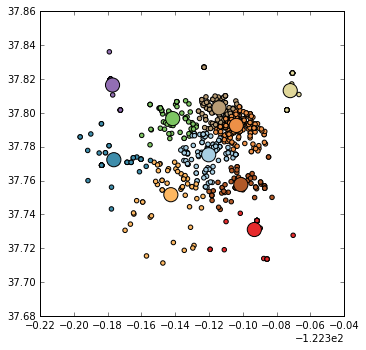

In [31]:
# Plotting!
%matplotlib inline
import matplotlib.pyplot as plt

colors = np.array(range(kmeans.cluster_centers_.shape[0]))

plt.figure(figsize=(12, 12))
plt.subplot(221)
plt.scatter(X[:,0], X[:,1], c=y_pred)
plt.scatter(kmeans.cluster_centers_[:,0], kmeans.cluster_centers_[:,1], s=200, c=colors)



In [32]:
clusters = []

def createJsonList(kmeans):
    list = []
    for i in range(kmeans.cluster_centers_.shape[0]):
        lon = float(kmeans.cluster_centers_[i,0])
        lat = float(kmeans.cluster_centers_[i,1])
        if [lat,lon] not in clusters:
            clusters.append([lat,lon])
        list.append([lat,lon])
    
    return list

In [33]:
# Making K-means and packaging data
import json
from csv import reader 
import numpy as np
import pylab as pl
from collections import OrderedDict

from sklearn.cluster import KMeans



x = []
readData(x)
X = np.array(x)

kmeans_2 = KMeans(n_clusters=2)
y_pred_2 = kmeans_2.fit_predict(X)

kmeans_3 = KMeans(n_clusters=3)
y_pred_3 = kmeans_3.fit_predict(X)

kmeans_4 = KMeans(n_clusters=4)
y_pred_4 = kmeans_4.fit_predict(X)

kmeans_5 = KMeans(n_clusters=5)
y_pred_5 = kmeans_5.fit_predict(X)

kmeans_6 = KMeans(n_clusters=6)
y_pred_6 = kmeans_6.fit_predict(X)

kmeans_7 = KMeans(n_clusters=7)
y_pred_7 = kmeans_7.fit_predict(X)

kmeans_8 = KMeans(n_clusters=8)
y_pred_8 = kmeans_8.fit_predict(X)

kmeans_9 = KMeans(n_clusters=9)
y_pred_9 = kmeans_9.fit_predict(X)

kmeans_10 = KMeans(n_clusters=10)
y_pred_10 = kmeans_10.fit_predict(X)

points = []
found = set()

for i in range(y_pred_2.size):
    floatX = float(X[i,0])
    floatY = float(X[i,1])
    if isNew(floatX,floatY,found):
        k2 = int(y_pred_2[i])
        k3 = int(y_pred_3[i])
        k4 = int(y_pred_4[i])
        k5 = int(y_pred_5[i])
        k6 = int(y_pred_6[i])
        k7 = int(y_pred_7[i])
        k8 = int(y_pred_8[i])
        k9 = int(y_pred_9[i])
        k10 = int(y_pred_10[i])
        point = {'lat':floatY,'lon':floatX,'k2':k2,'k3':k3,'k4':k4,'k5':k5,'k6':k6,'k7':k7,'k8':k8,'k9':k9,'k10':k10}
        points.append(point)

k2 = createJsonList(kmeans_2)
k3 = createJsonList(kmeans_3)
k4 = createJsonList(kmeans_4)
k5 = createJsonList(kmeans_5)
k6 = createJsonList(kmeans_6)
k7 = createJsonList(kmeans_7)
k8 = createJsonList(kmeans_8)
k9 = createJsonList(kmeans_9)
k10 = createJsonList(kmeans_10)

data = OrderedDict([['k2',k2],['k3',k3],['k4',k4],['k5',k5],['k6',k6],['k7',k7],['k8',k8],['k9',k9],['k10',k10],['dataPoints',points]])

with open('2D-all.json', 'w') as txtfile:
    json.dump(data, txtfile, sort_keys=True)

In [34]:
def findGenres(unique_genres):
    for movie in json_obj["data"]:
        if movie["genres"] != []:
            for g in movie["genres"]:
                genre = g
                if genre not in unique_genres:
                    unique_genres.append(genre)
                        
unique_genres = []
findGenres(unique_genres)
print len(unique_genres)

10


In [35]:
# Making K-means and packaging data
import json
from csv import reader 
import numpy as np
import pylab as pl
from collections import OrderedDict

from sklearn.cluster import KMeans

for genre in unique_genres:
    x = []
    readDataSpecific(x, genre)
    X = np.array(x)

    kmeans_2 = KMeans(n_clusters=2)
    y_pred_2 = kmeans_2.fit_predict(X)

    kmeans_3 = KMeans(n_clusters=3)
    y_pred_3 = kmeans_3.fit_predict(X)

    kmeans_4 = KMeans(n_clusters=4)
    y_pred_4 = kmeans_4.fit_predict(X)

    kmeans_5 = KMeans(n_clusters=5)
    y_pred_5 = kmeans_5.fit_predict(X)

    kmeans_6 = KMeans(n_clusters=6)
    y_pred_6 = kmeans_6.fit_predict(X)

    kmeans_7 = KMeans(n_clusters=7)
    y_pred_7 = kmeans_7.fit_predict(X)

    kmeans_8 = KMeans(n_clusters=8)
    y_pred_8 = kmeans_8.fit_predict(X)

    kmeans_9 = KMeans(n_clusters=9)
    y_pred_9 = kmeans_9.fit_predict(X)

    kmeans_10 = KMeans(n_clusters=10)
    y_pred_10 = kmeans_10.fit_predict(X)

    points = []
    found = set()

    for i in range(y_pred_2.size):
        floatX = float(X[i,0])
        floatY = float(X[i,1])
        if isNew(floatX,floatY,found):
            k2 = int(y_pred_2[i])
            k3 = int(y_pred_3[i])
            k4 = int(y_pred_4[i])
            k5 = int(y_pred_5[i])
            k6 = int(y_pred_6[i])
            k7 = int(y_pred_7[i])
            k8 = int(y_pred_8[i])
            k9 = int(y_pred_9[i])
            k10 = int(y_pred_10[i])
            point = {'lat':floatY,'lon':floatX,'k2':k2,'k3':k3,'k4':k4,'k5':k5,'k6':k6,'k7':k7,'k8':k8,'k9':k9,'k10':k10}
            points.append(point)

    k2 = createJsonList(kmeans_2)
    k3 = createJsonList(kmeans_3)
    k4 = createJsonList(kmeans_4)
    k5 = createJsonList(kmeans_5)
    k6 = createJsonList(kmeans_6)
    k7 = createJsonList(kmeans_7)
    k8 = createJsonList(kmeans_8)
    k9 = createJsonList(kmeans_9)
    k10 = createJsonList(kmeans_10)

    data = OrderedDict([['k2',k2],['k3',k3],['k4',k4],['k5',k5],['k6',k6],['k7',k7],['k8',k8],['k9',k9],['k10',k10],['dataPoints',points]])

    with open('2D'+genre+'.json', 'w') as txtfile:
        json.dump(data, txtfile, sort_keys=True)

## Classification

In [37]:
import json

def read_json(file_name):
    with open(file_name) as data_file:    
        return json.load(data_file)
    
movie_list = read_json("Data/transformed_data3.json")['data']
movie_list[0]

{u'director': [u'Alan Parker'],
 u'genres': [u'Drama'],
 u'locations': [{u'Lat': 37.7924959, u'Lon': -122.4100354}],
 u'rating': 7.0,
 u'studio': [u'Metro-Goldwyn-Mayer', u'SLM Production Group'],
 u'title': u'Shoot the Moon',
 u'year': 1982}

In [38]:
from random import shuffle
from sklearn.ensemble import RandomForestClassifier as forest

def to_decade(year):
    return round(year - 5, -1)
    
def get_locations_of_genre(genre):
    positive = []
    negative = []
    
    for movie in movie_list:
        decade = to_decade(movie['year'])
        
        if genre in movie['genres']:
            for location in movie['locations']:
                positive.append([location['Lat'], location['Lon'], decade])
        else:
            for location in movie['locations']:
                negative.append([location['Lat'], location['Lon'], decade])
            
    return positive, negative

def get_train_test(genre, test_fraction):
    positive, negative = get_locations_of_genre(genre)
    print "balancing", len(positive), len(negative)
    values = min(len(positive), len(negative))
    test_values = int(values * test_fraction)
    shuffle(positive)
    shuffle(negative)
    
    # use first 1/5 of data as test data and rest as training data
    xtrain = positive[test_values:values] + negative[test_values:values]
    ytrain = [1 for _ in range(values - test_values)] + [0 for _ in range(values - test_values)]
    xtest = positive[:test_values] + negative[:test_values]
    ytest = [[1] for _ in range(test_values)] + [[0] for _ in range(test_values)] 
    
    print 'train:', len(xtrain), 'test:', len(xtest)
    return xtrain, ytrain, xtest, ytest

def train_test_forest(genre):
    print ""
    print "training ", genre
    xtrain, ytrain, xtest, ytest = get_train_test(genre, 0.2)
    
    clf = forest(n_estimators=5,criterion='gini')
    clf = clf.fit(xtrain, ytrain)
    predictions = clf.predict(xtest)
    
    # find number of correct estimates
    correct = 0
    for i in range(len(ytest)):
        if predictions[i] == ytest[i]:
            correct += 1
    
    print "total predictions", len(ytest)
    print "correct predictions", correct, correct / float(len(ytest))
    
    return clf
    
# save all the trained forests in a dictionary
genres = ['Drama', 'Action', 'Thriller', 'Comedy', 'Crime', 'Mystery', 'Adventure', 'Romance', 'Sci-Fi', 'Other']
forests = {}
for genre in genres:
    forests[genre] = train_test_forest(genre)


training  Drama
balancing 564 484
train: 776 test: 192
total predictions 192
correct predictions 124 0.645833333333

training  Action
balancing 261 787
train: 418 test: 104
total predictions 104
correct predictions 68 0.653846153846

training  Thriller
balancing 423 625
train: 678 test: 168
total predictions 168
correct predictions 107 0.636904761905

training  Comedy
balancing 330 718
train: 528 test: 132
total predictions 132
correct predictions 75 0.568181818182

training  Crime
balancing 249 799
train: 400 test: 98
total predictions 98
correct predictions 61 0.622448979592

training  Mystery
balancing 245 803
train: 392 test: 98
total predictions 98
correct predictions 54 0.551020408163

training  Adventure
balancing 159 889
train: 256 test: 62
total predictions 62
correct predictions 41 0.661290322581

training  Romance
balancing 250 798
train: 400 test: 100
total predictions 100
correct predictions 57 0.57

training  Sci-Fi
balancing 151 897
train: 242 test: 60
total predictions

In [39]:
import json

def write_json(obj, filename):
    with open(filename, 'w') as txtfile:
        json.dump(obj, txtfile, sort_keys=True)

def predict_coord(genre, X):
    result = []
    
    # make the predictions
    Y = forests[genre].predict_proba(X)
    
    for i in range(len(X)):
        val = round(Y[i][0], 2)
        result.append({'lat': X[i][0], 'lon': X[i][1], 'predict': val})
        
    return result

def create_prediction_file():
    result = {}
    
    for decade in range(1910, 2016, 10):
        
        obj = {}
        for genre in genres:
            
            X = []
            for lat in [37.709 + i * (37.804 - 37.709) / 20 for i in range(20)]:
                for lon in [-122.506 + i * (-122.378 - -122.506) / 20 for i in range(20)]:
                    X.append([lat, lon, decade])
            
            obj[genre] = predict_coord(genre, X)
        
        result[decade] = obj
        
    return result

result = create_prediction_file()

write_json(result, "classification.json")